In [2]:
print('Author: Abizar Egi')
print('Project: Bank Customers with KMeans')
print('Created on 01 August 2021, 07:55 WIB')
input('What is Your Name: ')
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

Author: Abizar Egi
Project: Bank Customers with KMeans
Created on 01 August 2021, 07:55 WIB


In [3]:
data = pd.read_csv('C:/Users/abiza/Downloads/Project & Publikasi/Bank Customer Segmentation/BankCustomerData.csv')
data

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,term_deposit
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42634,21,student,single,secondary,no,2488,no,no,telephone,12,jan,661,2,92,1,success,yes
42635,87,retired,married,primary,no,2190,no,no,telephone,12,jan,512,2,-1,0,unknown,yes
42636,34,blue-collar,married,primary,no,6718,no,no,cellular,13,jan,278,4,97,1,other,no
42637,22,student,single,secondary,no,254,no,no,cellular,13,jan,143,2,-1,0,unknown,yes


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42639 entries, 0 to 42638
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   age           42639 non-null  int64 
 1   job           42639 non-null  object
 2   marital       42639 non-null  object
 3   education     42639 non-null  object
 4   default       42639 non-null  object
 5   balance       42639 non-null  int64 
 6   housing       42639 non-null  object
 7   loan          42639 non-null  object
 8   contact       42639 non-null  object
 9   day           42639 non-null  int64 
 10  month         42639 non-null  object
 11  duration      42639 non-null  int64 
 12  campaign      42639 non-null  int64 
 13  pdays         42639 non-null  int64 
 14  previous      42639 non-null  int64 
 15  poutcome      42639 non-null  object
 16  term_deposit  42639 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.5+ MB


In [5]:
data.describe()

,age,balance,day,duration,campaign,pdays,previous
count,42639.000000,42639.000000,42639.000000,42639.000000,42639.000000,42639.000000,42639.000000
mean,40.788808,1331.863951,15.854781,255.957504,2.816412,34.169141,0.465442
std,10.200236,3011.537676,8.293901,258.361368,3.163564,92.041713,2.166705
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,62.000000,8.000000,101.000000,1.000000,-1.000000,0.000000
50%,39.000000,429.000000,16.000000,177.000000,2.000000,-1.000000,0.000000
75%,48.000000,1381.500000,21.000000,315.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,536.000000,275.000000


In [6]:
data.shape

(42639, 17)

In [7]:
data = data.drop(columns=['pdays'], inplace=False)
dc = data.columns
dc

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'previous',
       'poutcome', 'term_deposit'],
      dtype='object')

In [8]:
for col in dc:
    print("unique value --> " + col, ":", data[col].unique(), 
          "\nTotal unique value =" , len(data[col].unique()), 
          "/", len(data), "\n")

unique value --> age : [58 44 33 47 35 28 42 43 41 29 53 57 51 45 60 56 32 25 40 39 52 46 36 49
 59 37 50 54 55 48 24 38 31 30 27 34 23 26 61 22 21 20 66 62 83 75 67 70
 65 68 64 69 72 71 19 76 85 63 90 82 73 74 78 80 94 79 77 86 95 81 18 89
 84 87 92] 
Total unique value = 75 / 42639 

unique value --> job : ['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student'] 
Total unique value = 12 / 42639 

unique value --> marital : ['married' 'single' 'divorced'] 
Total unique value = 3 / 42639 

unique value --> education : ['tertiary' 'secondary' 'unknown' 'primary'] 
Total unique value = 4 / 42639 

unique value --> default : ['no' 'yes'] 
Total unique value = 2 / 42639 

unique value --> balance : [2143   29    2 ... 6447 6718 1962] 
Total unique value = 7078 / 42639 

unique value --> housing : ['yes' 'no'] 
Total unique value = 2 / 42639 

unique value --> loan : ['no' 'yes'] 
Total unique valu

In [9]:
for col in data.columns:
    if data[col].dtype==np.object:
        print(col + ": \n", data[col].value_counts(), "\n")
        continue

job: 
 blue-collar      9536
management       8851
technician       7223
admin.           4810
services         4033
retired          1880
self-employed    1500
entrepreneur     1453
unemployed       1193
housemaid        1178
student           718
unknown           264
Name: job, dtype: int64 

marital: 
 married     25868
single      11806
divorced     4965
Name: marital, dtype: int64 

education: 
 secondary    22066
tertiary     12302
primary       6581
unknown       1690
Name: education, dtype: int64 

default: 
 no     41828
yes      811
Name: default, dtype: int64 

housing: 
 yes    24590
no     18049
Name: housing, dtype: int64 

loan: 
 no     35554
yes     7085
Name: loan, dtype: int64 

contact: 
 cellular     27218
unknown      12776
telephone     2645
Name: contact, dtype: int64 

month: 
 may    13532
jul     6587
aug     5987
jun     5128
nov     3895
apr     2718
feb     2296
jan     1224
oct      518
sep      282
mar      258
dec      214
Name: month, dtype: int64 

p

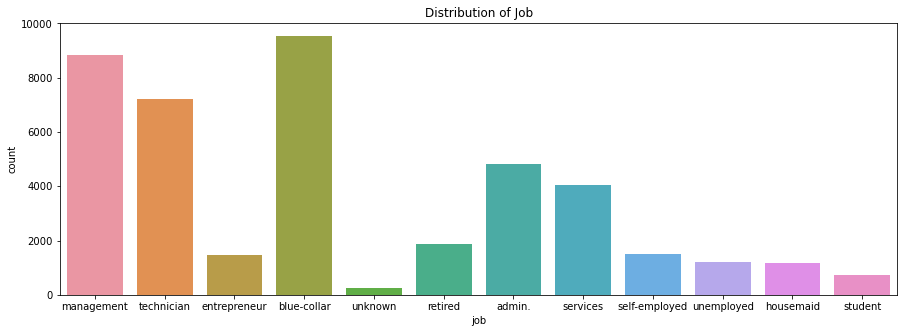

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.subplots(figsize=(15,5))
sns.countplot(x='job', data=data)
plt.title('Distribution of Job')
plt.savefig('Distribution of Job.png')

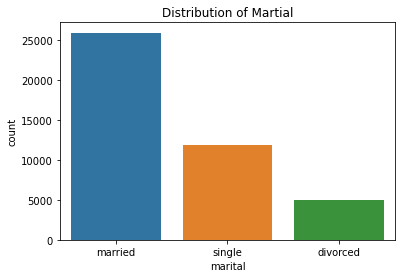

In [25]:
sns.countplot(x='marital', data=data)
plt.title('Distribution of Martial')
plt.savefig('Distribution of Martial.png')

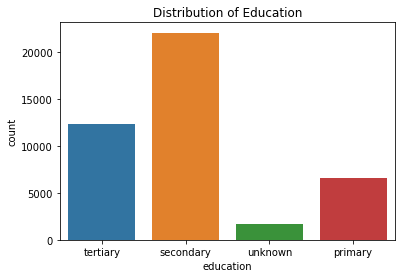

In [26]:
sns.countplot(x='education', data=data)
plt.title('Distribution of Education')
plt.savefig('Distribution of Education.png')

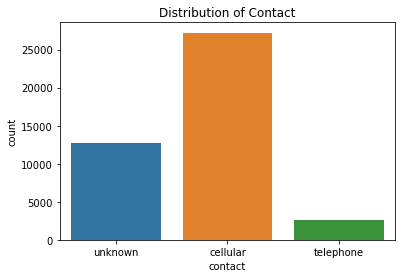

In [27]:
sns.countplot(x='contact', data=data)
plt.title('Distribution of Contact')
plt.savefig('Distribution of Contact.png')

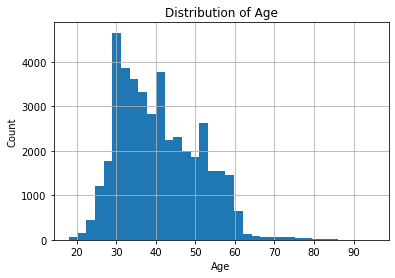

In [28]:
data.hist('age', bins=35)
plt.title('Distribution of Age')
plt.ylabel('Count')
plt.xlabel('Age')
plt.savefig('Distribution of Age')

C:\Users\abiza\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


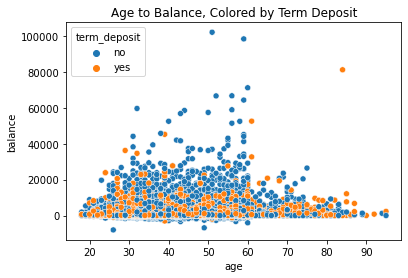

In [29]:
sns.scatterplot('age', 'balance', hue='term_deposit', data=data)
plt.title('Age to Balance, Colored by Term Deposit')
plt.savefig('Age to Balance, Colored by Term Deposit.png')

In [16]:
from sklearn.cluster import KMeans

x = data[['age','balance']]
wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    km.fit(x)
    wcss.append(km.inertia_)
print('Complete')

Complete


<function matplotlib.pyplot.show(close=None, block=None)>

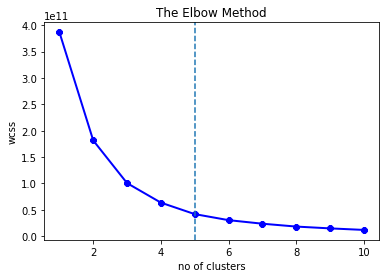

In [31]:
plt.plot(range(1, 11), wcss, linewidth=2, color='blue', marker='8')
plt.axvline(x=5, ls='--')
plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('wcss')
plt.savefig('Elbow Method.png')
plt.show

In [18]:
model = KMeans(n_clusters=5, init='k-means++', random_state=0)
model.fit_predict(x)

array([3, 0, 0, ..., 1, 0, 3])

In [19]:
clusters = data.copy()
clusters['Cluster_Prediction'] = model.fit_predict(x)
clusters.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,previous,poutcome,term_deposit,Cluster_Prediction
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,0,unknown,no,3
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,0,unknown,no,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,0,unknown,no,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,0,unknown,no,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,0,unknown,no,0
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,0,unknown,no,0
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,0,unknown,no,0
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,0,unknown,no,0
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,0,unknown,no,0
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,0,unknown,no,0


In [20]:
print('cluster prediction number 1 :', len(clusters[clusters['Cluster_Prediction']==1]), '/', len(clusters))
print('cluster prediction number 2 :', len(clusters[clusters['Cluster_Prediction']==2]), '/', len(clusters))
print('cluster prediction number 3 :', len(clusters[clusters['Cluster_Prediction']==3]), '/', len(clusters))
print('cluster prediction number 4 :', len(clusters[clusters['Cluster_Prediction']==4]), '/', len(clusters))
print('cluster prediction number 0 :', len(clusters[clusters['Cluster_Prediction']==0]), '/', len(clusters))

cluster prediction number 1 : 1614 / 42639
cluster prediction number 2 : 28 / 42639
cluster prediction number 3 : 6425 / 42639
cluster prediction number 4 : 298 / 42639
cluster prediction number 0 : 34274 / 42639


In [21]:
model.cluster_centers_

array([[4.02719314e+01, 3.96336047e+02],
       [4.32044610e+01, 8.80336431e+03],
       [5.11428571e+01, 5.58547500e+04],
       [4.27508161e+01, 3.28562615e+03],
       [4.38120805e+01, 2.11392617e+04]])

Before Clustering :



C:\Users\abiza\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


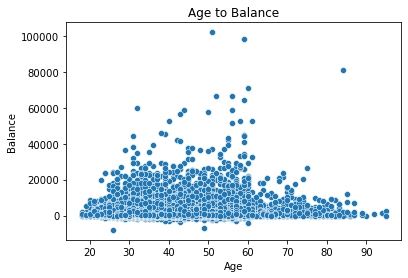

After Clustering :



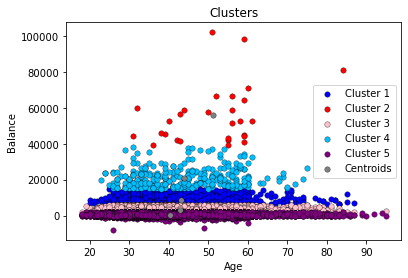

In [32]:
print('Before Clustering :\n')
sns.scatterplot('age', 'balance', data=data)
plt.title('Age to Balance')
plt.xlabel('Age')
plt.ylabel('Balance')
plt.savefig('Before Clustering.png')
plt.show()

print('After Clustering :\n')
plt.scatter(x=clusters[clusters['Cluster_Prediction']==1]['age']
           , y=clusters[clusters['Cluster_Prediction']==1]['balance'],
           s=30, edgecolor='black', linewidth=0.3, c='blue', label='Cluster 1')
plt.scatter(x=clusters[clusters['Cluster_Prediction']==2]['age']
           , y=clusters[clusters['Cluster_Prediction']==2]['balance'],
           s=30, edgecolor='black', linewidth=0.3, c='red', label='Cluster 2')
plt.scatter(x=clusters[clusters['Cluster_Prediction']==3]['age']
           , y=clusters[clusters['Cluster_Prediction']==3]['balance'],
           s=30, edgecolor='black', linewidth=0.3, c='pink', label='Cluster 3')
plt.scatter(x=clusters[clusters['Cluster_Prediction']==4]['age']
           , y=clusters[clusters['Cluster_Prediction']==4]['balance'],
           s=30, edgecolor='black', linewidth=0.3, c='deepskyblue', label='Cluster 4')
plt.scatter(x=clusters[clusters['Cluster_Prediction']==0]['age']
           , y=clusters[clusters['Cluster_Prediction']==0]['balance'],
           s=30, edgecolor='black', linewidth=0.3, c='purple', label='Cluster 5')

plt.scatter(x=model.cluster_centers_[:,0], y=model.cluster_centers_[:,1], s=30, c='grey', label='Centroids', edgecolor='black', linewidth=0.3)
plt.legend(loc='right')
plt.xlabel('Age')
plt.ylabel('Balance')
plt.title('Clusters')
plt.savefig('Clustering.png')
plt.show()